## Skull stripping notebook

In [8]:
# Utility libraries
import os
import random
from datetime import datetime

# Core libraries
import numpy as np
import tensorflow as tf

from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Softmax, Conv2D, MaxPooling2D, Dropout, Flatten, UpSampling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, Input
from tensorflow.keras import regularizers
from tensorflow.keras import metrics
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from keras.utils import np_utils
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model, save_model
from keras.optimizers import Adam
from tensorflow.keras import Input
from skimage.color import rgb2gray

import matplotlib.pyplot as plt # For plotting purposes

from skimage.io import imsave
import sys
import warnings
warnings.filterwarnings('ignore')

# Bug still not solved, resort to old keras module (see below)
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard

# Use the above import when the bug is solved
#import keras
#from keras.callbacks import ModelCheckpoint
#from keras.callbacks import TensorBoard
# ------------------------------------------#

import cv2
import pandas
from tqdm import tqdm

Using TensorFlow backend.


#### load numpy arrays (created in notebook "note_mri_1")

In [2]:
import numpy as np

In [3]:
#load if needed
with open('data.npy', 'rb') as f:
    x_train = np.load(f)
    y_train = np.load(f)
    x_val = np.load(f)
    y_val = np.load(f)
    x_test = np.load(f)
    y_test = np.load(f)  

In [4]:
print(x_train.shape)
print(y_train.shape)
print(x_val.shape)
print(y_val.shape)
print(x_test.shape)
print(y_test.shape)

(2828, 256, 256, 3)
(2828, 256, 256, 1)
(708, 256, 256, 3)
(708, 256, 256, 1)
(393, 256, 256, 3)
(393, 256, 256, 1)


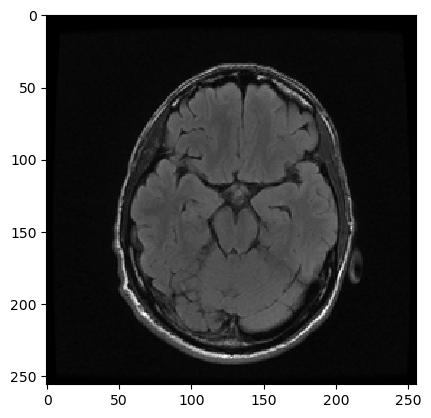

In [132]:
plt.imshow(x_train[2,:,:,1], cmap='gray')

#### pre-processing

In [5]:
#global standardization 
mean = np.mean(x_train)
std = np.std(x_train)
x_train_temp, x_val_temp, x_test_temp = x_train.copy(), x_val.copy(), x_test.copy()
x_train_temp -= mean
x_train_temp /= std

x_val_temp -= mean  #using training mean and std also for val data standardization
x_val_temp /= std

x_test_temp -= mean  #using training mean and std also for test data standardization
x_test_temp /= std

#### define model

In [9]:
def unet(batch_norm=False):
    input_size=(256,256,3)
    inputs = Input(input_size)

    conv1 = Conv2D(32, (3, 3), padding='same')(inputs)
    if batch_norm:
        conv1 = BatchNormalization(axis=3)(conv1)
    conv1 = Activation('relu')(conv1)

    conv1 = Conv2D(32, (3, 3), padding='same')(conv1)
    if batch_norm:
        conv1 = BatchNormalization(axis=3)(conv1)
    conv1 = Activation('relu')(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), padding='same')(pool1)
    if batch_norm:
        conv2 = BatchNormalization(axis=3)(conv2)
    conv2 = Activation('relu')(conv2)

    conv2 = Conv2D(64, (3, 3), padding='same')(conv2)
    if batch_norm:
        conv2 = BatchNormalization(axis=3)(conv2)
    conv2 = Activation('relu')(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), padding='same')(pool2)
    if batch_norm:
        conv3 = BatchNormalization(axis=3)(conv3)
    conv3 = Activation('relu')(conv3)

    conv3 = Conv2D(128, (3, 3), padding='same')(conv3)
    if batch_norm:
        conv3 = BatchNormalization(axis=3)(conv3)
    conv3 = Activation('relu')(conv3)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), padding='same')(pool3)
    if batch_norm:
        conv4 = BatchNormalization(axis=3)(conv4)
    conv4 = Activation('relu')(conv4)

    conv4 = Conv2D(256, (3, 3), padding='same')(conv4)
    if batch_norm:
        conv4 = BatchNormalization(axis=3)(conv4)
    conv4 = Activation('relu')(conv4)

    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), padding='same')(pool4)
    if batch_norm:
        conv5 = BatchNormalization(axis=3)(conv5)
    conv5 = Activation('relu')(conv5)

    conv5 = Conv2D(512, (3, 3), padding='same')(conv5)
    if batch_norm:
        conv5 = BatchNormalization(axis=3)(conv5)
    conv5 = Activation('relu')(conv5)

    up6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv4], axis=3)

    conv6 = Conv2D(256, (3, 3), padding='same')(up6)
    if batch_norm:
        conv6 = BatchNormalization(axis=3)(conv6)
    conv6 = Activation('relu')(conv6)

    conv6 = Conv2D(256, (3, 3), padding='same')(conv6)
    if batch_norm:
        conv6 = BatchNormalization(axis=3)(conv6)
    conv6 = Activation('relu')(conv6)

    up7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)

    conv7 = Conv2D(128, (3, 3), padding='same')(up7)
    if batch_norm:
        conv7 = BatchNormalization(axis=3)(conv7)
    conv7 = Activation('relu')(conv7)

    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)
    if batch_norm:
        conv7 = BatchNormalization(axis=3)(conv7)
    conv7 = Activation('relu')(conv7)

    up8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)

    conv8 = Conv2D(64, (3, 3), padding='same')(up8)
    if batch_norm:
        conv8 = BatchNormalization(axis=3)(conv8)
    conv8 = Activation('relu')(conv8)

    conv8 = Conv2D(64, (3, 3), padding='same')(conv8)
    if batch_norm:
        conv8 = BatchNormalization(axis=3)(conv8)
    conv8 = Activation('relu')(conv8)

    up9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)

    conv9 = Conv2D(32, (3, 3), padding='same')(up9)
    if batch_norm:
        conv9 = BatchNormalization(axis=3)(conv9)
    conv9 = Activation('relu')(conv9)

    conv9 = Conv2D(32, (3, 3), padding='same')(conv9)
    if batch_norm:
        conv9 = BatchNormalization(axis=3)(conv9)
    conv9 = Activation('relu')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    return model


In [10]:
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        activation[0][0]                 
______________________________________________________________________________________________

In [11]:
def dice_coefficient(prediction, ground_truth):
    prediction = np.round(prediction).astype(int)
    ground_truth = np.round(ground_truth).astype(int)
    return np.sum(prediction[ground_truth == 1]) * 2.0 / (np.sum(prediction) + np.sum(ground_truth))


##### pre-trained weights upload

In [12]:
weights_path = os.path.abspath('.\weights_128_skull.h5')

In [13]:
os.path.isfile(os.path.abspath(weights_path))

True

##### inference

In [14]:
#using pre-trained U-Net for predictions of skull removal mask
#weights_path = './weights_128.h5'
#train_images_path = './data/train/'
#test_images_path = './data/valid/'
#predictions_path = './predictions/'

def predict(data):
    # load model with weights 
    model = unet()
    model.load_weights(weights_path)

    # make predictions
    imgs_mask_pred = model.predict(data, verbose=1)

    return imgs_mask_pred

imgs_mask_pred_train = predict(x_train_temp)
imgs_mask_pred_val = predict(x_val_temp)
imgs_mask_pred_test = predict(x_test_temp)


393/393 [==============================] - 96s 245ms/sample


##### testing inference results

In [142]:
imgs_mask_pred_train.shape

(2828, 256, 256, 1)

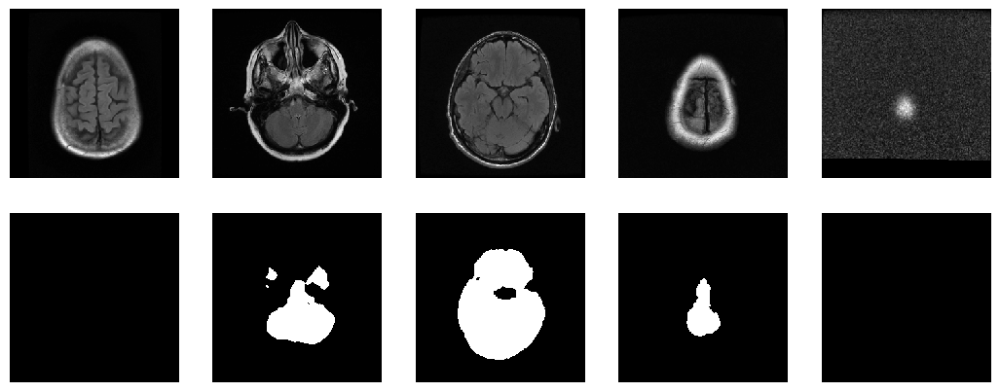

In [15]:
fig, axs = plt.subplots(2,5, figsize=(13,5))
for _ in range(5): axs[0,_].imshow(x_train_temp[_,:,:,1],cmap='gray'), axs[0,_].axis('off') 
for _ in range(5): axs[1,_].imshow(np.round(imgs_mask_pred_train[_]).reshape(256,-1), cmap='gray'), axs[1,_].axis('off') 

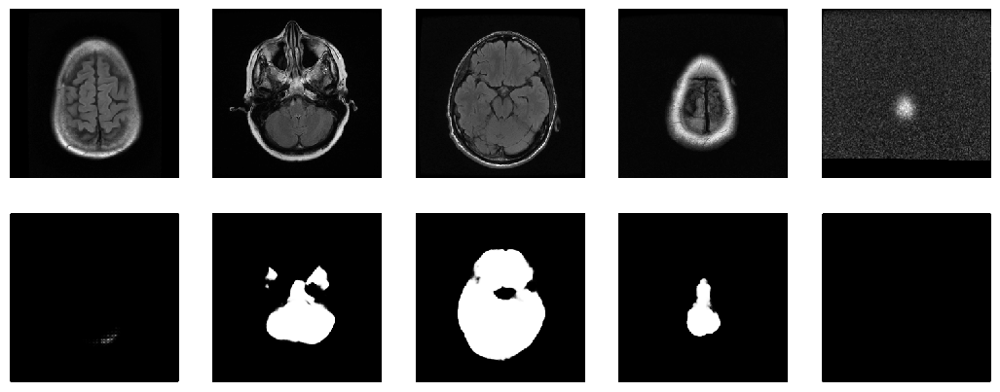

In [17]:
fig, axs = plt.subplots(2,5, figsize=(13,5))
for _ in range(5): axs[0,_].imshow(x_train_temp[_,:,:,1],cmap='gray'), axs[0,_].axis('off') 
for _ in range(5): axs[1,_].imshow(imgs_mask_pred_train[_].reshape(256,-1), cmap='gray'), axs[1,_].axis('off') 

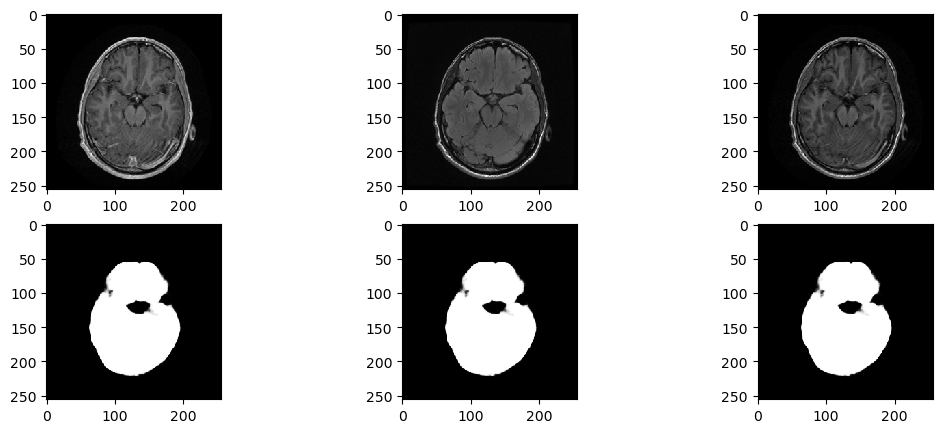

In [148]:
fig, axs = plt.subplots(2,3, figsize=(13,5))
for _ in range(3): axs[0,_].imshow(x_train_temp[2,:,:,_],cmap='gray')
for _ in range(3): axs[1,_].imshow(imgs_mask_pred_train[2].reshape(256,-1), cmap='gray')

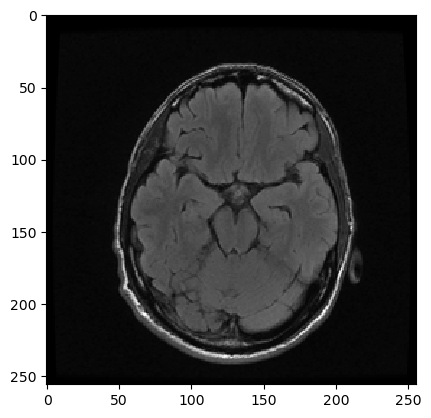

In [117]:
plt.imshow(x_train_temp[2][:, :, 1],cmap='gray')

In [153]:
pred = imgs_mask_pred_train[11].reshape(256,-1)

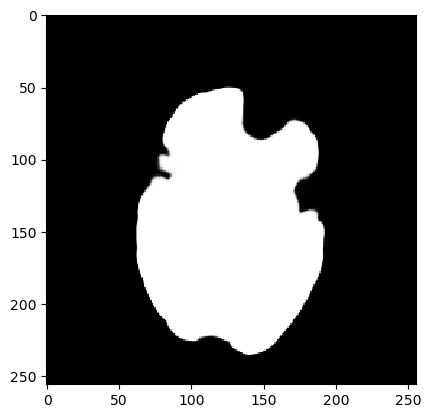

In [154]:
plt.imshow(pred, cmap='gray')

In [97]:
pred.shape

(256, 256)

In [103]:
pred_round = (np.round(imgs_mask_pred[_].reshape(256,-1))).astype(np.uint8)
pred_round.shape

(256, 256)

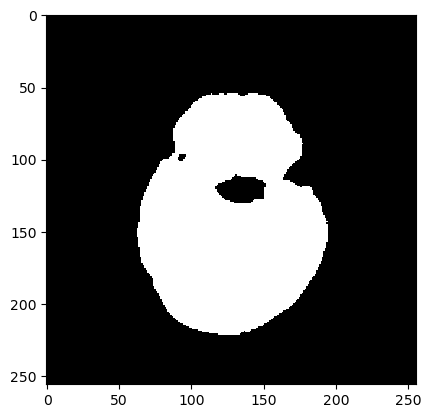

In [104]:
plt.imshow(pred_round, cmap='gray')

In [109]:
unique, counts = np.unique(pred_round, return_counts=True)
print(np.asarray((unique, counts)).T)

[[    0 49825]
 [    1 15711]]


In [122]:
prod = x_train[2][:, :, 1] * pred_round

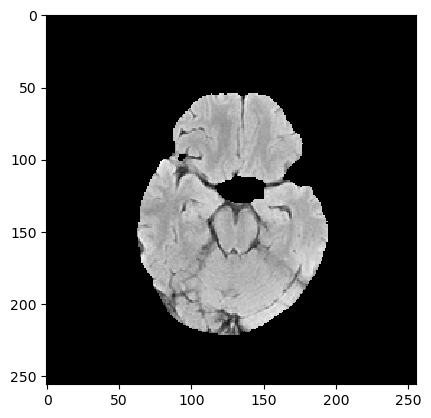

In [126]:
plt.imshow(prod, cmap='gray')

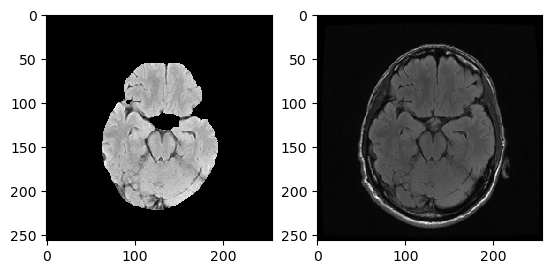

In [129]:
fig , axs = plt.subplots(1,2)
axs[0].imshow(prod, cmap='gray')
axs[1].imshow(x_train[2][:, :, 1], cmap='gray')

In [132]:
pred_round.shape

(256, 256)

In [133]:
ret = np.empty((256, 256, 3), dtype=np.uint8)
ret[:, :, 2] = ret[:, :, 1] = ret[:, :, 0] = pred_round

In [136]:
prod3d = x_train[12] * ret
prod3d.shape

(256, 256, 3)

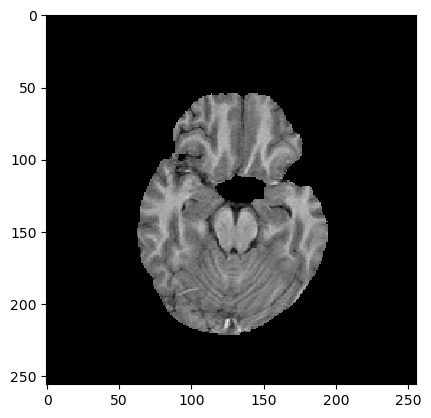

In [141]:
plt.imshow(prod3d[:,:,2], cmap='gray')

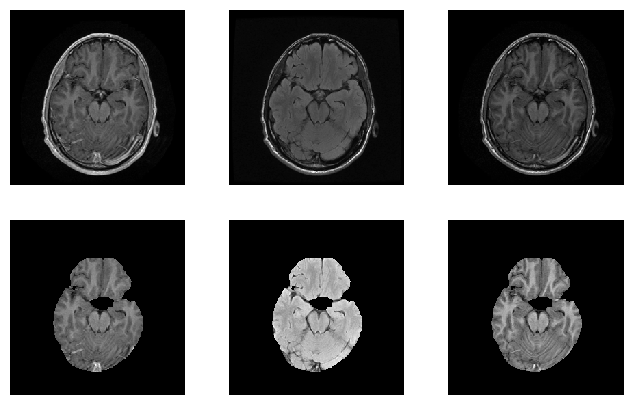

In [144]:
fig, axs = plt.subplots(2,3, figsize=(8,5))
for _ in range(3): axs[0,_].imshow(x_train[2,:,:,_],cmap='gray'), axs[0,_].axis('off')
for _ in range(3): axs[1,_].imshow(prod3d[:,:,_], cmap='gray'), axs[1,_].axis('off')

#### No post-processing

In [154]:
imgs_mask_pred.shape

(2828, 256, 256, 1)

In [103]:
pred_round = (np.round(imgs_mask_pred[_].reshape(256,-1))).astype(np.uint8)
pred_round.shape

(256, 256)

In [212]:
def get_3d_mask(temp_pred):
    
    pred_round = (np.round(temp_pred.reshape(256,-1))).astype(np.uint8)
    temp_mask3d = np.empty((256, 256, 3), dtype=np.uint8)
    temp_mask3d[:, :, 2] = temp_mask3d[:, :, 1] = temp_mask3d[:, :, 0] = pred_round
    return temp_mask3d

def get_stripped_imgs(data,mask_pred):
    new_x = []
    for i in tqdm(range(len(data))):
        mask3d = get_3d_mask(mask_pred[i])
        prod3d = data[i] * mask3d
        new_x.append(prod3d)
    return np.array(new_x)

stripped_x_train = get_stripped_imgs(x_train, imgs_mask_pred_train)
stripped_x_val = get_stripped_imgs(x_val, imgs_mask_pred_val)
stripped_x_test = get_stripped_imgs(x_test, imgs_mask_pred_test)

100%|███████████████████████████████████████████████████████████████████████████████| 393/393 [00:00<00:00, 605.90it/s]


In [30]:
stripped_x_train.shape

(2828, 256, 256, 3)

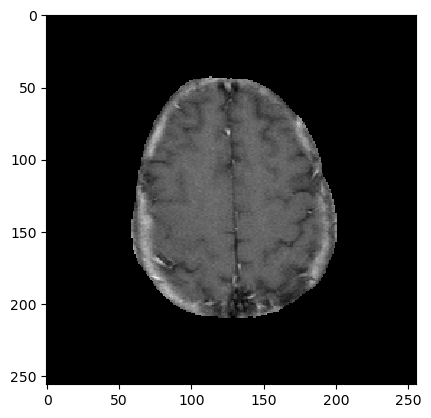

In [31]:
plt.imshow(stripped_x_train[300,:,:,2], cmap='gray')

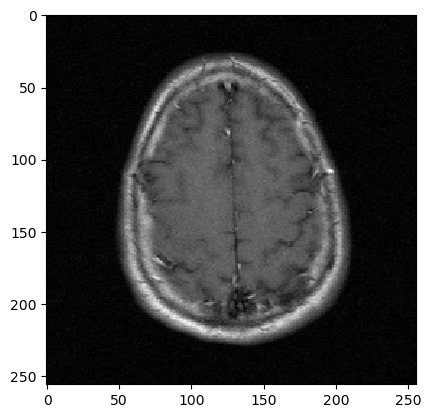

In [32]:
plt.imshow(x_train[300,:,:,2], cmap='gray')

In [33]:
#save
with open('data_skull_stripped.npy', 'wb') as f:
    np.save(f, stripped_x_train)
    np.save(f, y_train)
    np.save(f, stripped_x_val)
    np.save(f, y_val)
    np.save(f, stripped_x_test)
    np.save(f, y_test)

##### testing new data

In [47]:
print(stripped_x_train.shape)
print(y_train.shape)
print(stripped_x_val.shape)
print(y_val.shape)
print(stripped_x_test.shape)
print(y_test.shape)

(2828, 256, 256, 3)
(2828, 256, 256, 1)
(708, 256, 256, 3)
(708, 256, 256, 1)
(393, 256, 256, 3)
(393, 256, 256, 1)


(<matplotlib.image.AxesImage at 0x296d2c90688>, (-0.5, 255.5, 255.5, -0.5))

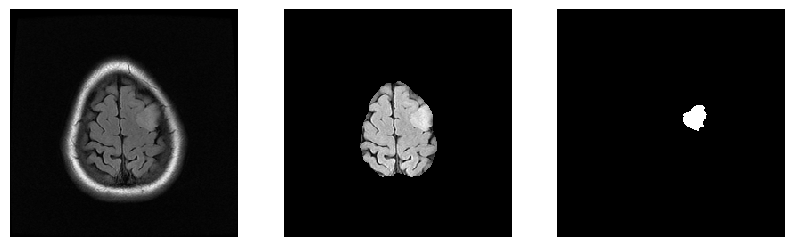

In [34]:
fig, axs = plt.subplots(1,3, figsize=(10,7))
axs[0].imshow(x_train[5,:,:,1], cmap='gray'), axs[0].axis('off')
axs[1].imshow(stripped_x_train[5,:,:,1], cmap='gray') , axs[1].axis('off')
axs[2].imshow(y_train[5].reshape((256,-1)), cmap='gray'), axs[2].axis('off')

(<matplotlib.image.AxesImage at 0x26039a1ee08>, (-0.5, 255.5, 255.5, -0.5))

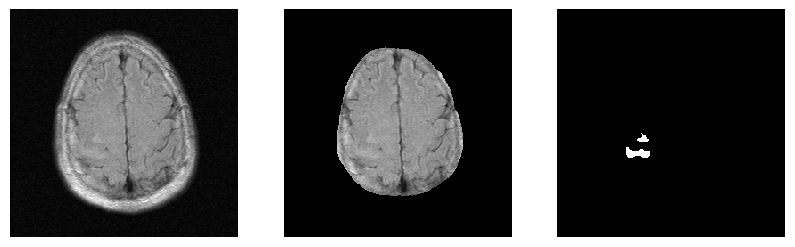

In [198]:
fig, axs = plt.subplots(1,3, figsize=(10,7))
axs[0].imshow(x_train[300,:,:,1], cmap='gray'), axs[0].axis('off')
axs[1].imshow(stripped_x_train[300,:,:,1], cmap='gray') , axs[1].axis('off')
axs[2].imshow(y_train[300].reshape((256,-1)), cmap='gray'), axs[2].axis('off')

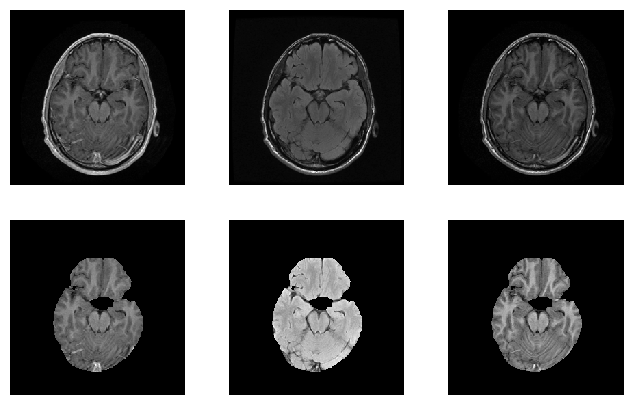

In [36]:
fig, axs = plt.subplots(2,3, figsize=(8,5))
for _ in range(3): axs[0,_].imshow(x_train[2,:,:,_],cmap='gray'), axs[0,_].axis('off')
for _ in range(3): axs[1,_].imshow(stripped_x_train[2,:,:,_], cmap='gray'), axs[1,_].axis('off')

In [210]:
x_train.shape

(2828, 256, 256, 3)

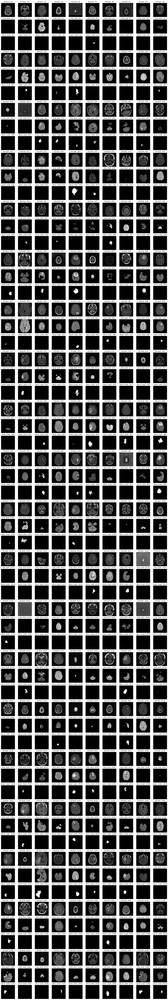

In [221]:
fig, axs = plt.subplots(60,10, figsize=(20,120))
for i in range(20):
    for _ in range(10): axs[0+3*i,_].imshow(x_train[_+10*i,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{_+10*i}', fontsize=9)
    for _ in range(10): axs[1+3*i,_].imshow(stripped_x_train[_+10*i,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{_+10*i}',fontsize=9)
    for _ in range(10): axs[2+3*i,_].imshow(np.reshape(y_train[_+10*i], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{_+10*i}',fontsize=9)

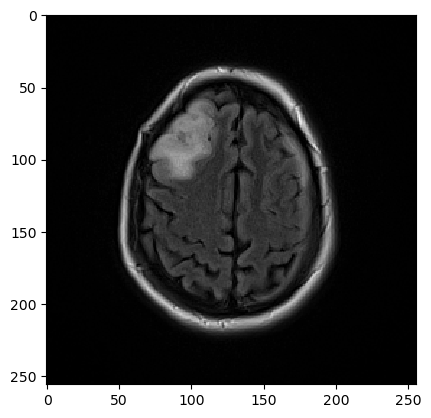

In [111]:
plt.imshow(x_train[23,:,:,1], cmap='gray')

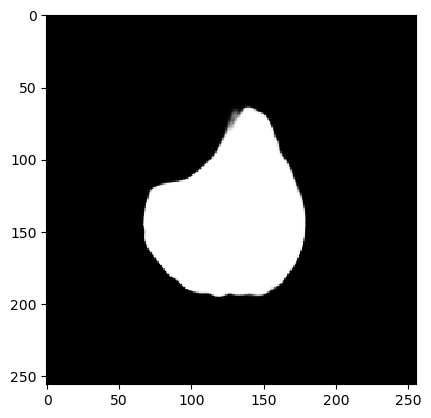

In [106]:
plt.imshow(np.reshape(imgs_mask_pred_train[23], (256,-1)),cmap='gray')


In [112]:
temp_y = np.reshape(imgs_mask_pred_train[23].copy(), (256,-1))

In [124]:
temp_y[temp_y<=0.0001] = 0
temp_y[temp_y>0.0001] = 1

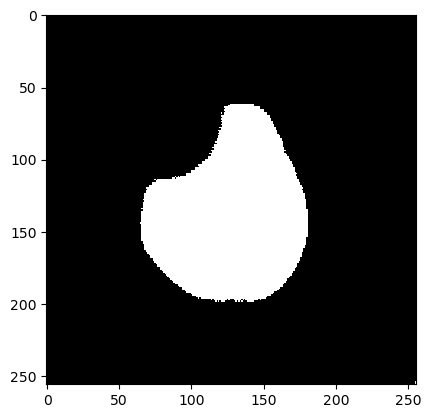

In [148]:
plt.imshow(temp_y, cmap='gray')

In [135]:
temp_y = temp_y.astype('uint8')

In [5]:
x_train[12].shape

(256, 256, 3)

In [13]:
import matplotlib.pyplot as plt # For plotting purposes


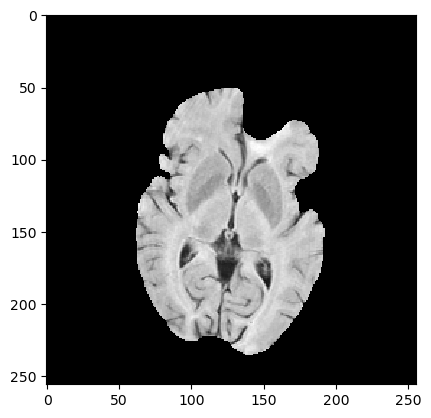

In [18]:
plt.imshow(gray, cmap='gray')

In [35]:
image.max()

90.0

In [37]:
im_bw = cv2.cvtColor(x_train[11], cv2.COLOR_RGB2GRAY)
im_bw.max()

74.73

In [41]:
def reshape(x):
    return np.reshape(x, (256,256))

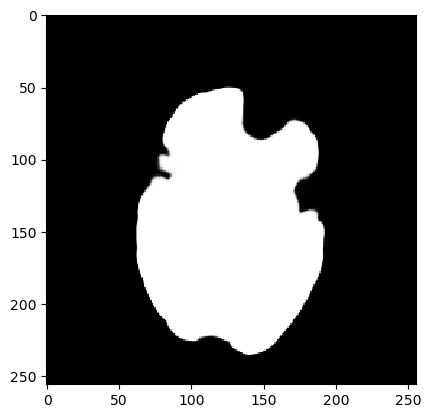

In [181]:
plt.imshow(reshape(imgs_mask_pred_train[11]),cmap='gray')

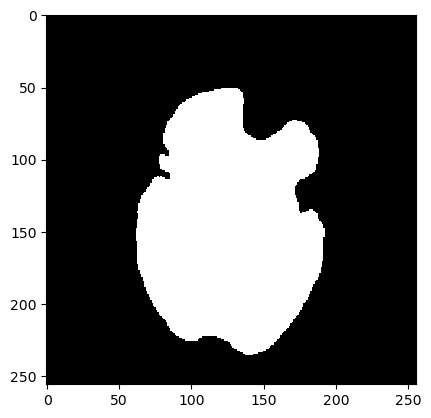

In [199]:
plt.imshow(np.round(reshape(imgs_mask_pred_train[11])),cmap='gray')

In [208]:
temp_y = np.reshape(imgs_mask_pred_train[11].copy(), (256,-1))
x = 1e-5
temp_y[temp_y<=x] = 1
temp_y[temp_y>(1-x)] = 1

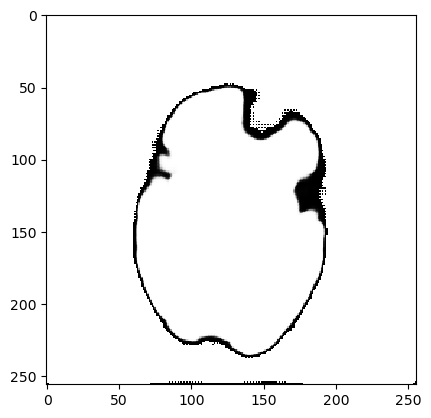

In [209]:
plt.imshow(temp_y,cmap='gray')

In [356]:
def contrast(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y<=x] = 1
    temp_y[temp_y>(1-x)] = 1
    return temp_y

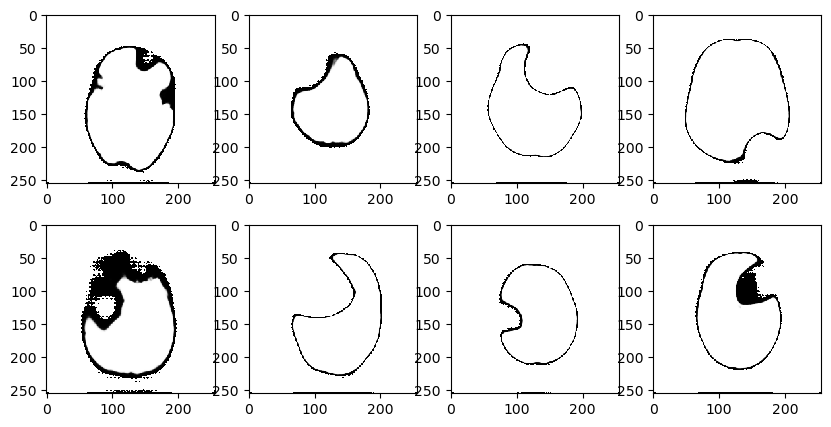

In [357]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]): axs[0,n].imshow(contrast(imgs_mask_pred_train[e],1e-7),cmap='gray'), axs[0,n]
for n,e in enumerate([95,99,104,117]): axs[1,n].imshow(contrast(imgs_mask_pred_train[e],1e-7),cmap='gray'), axs[1,n]

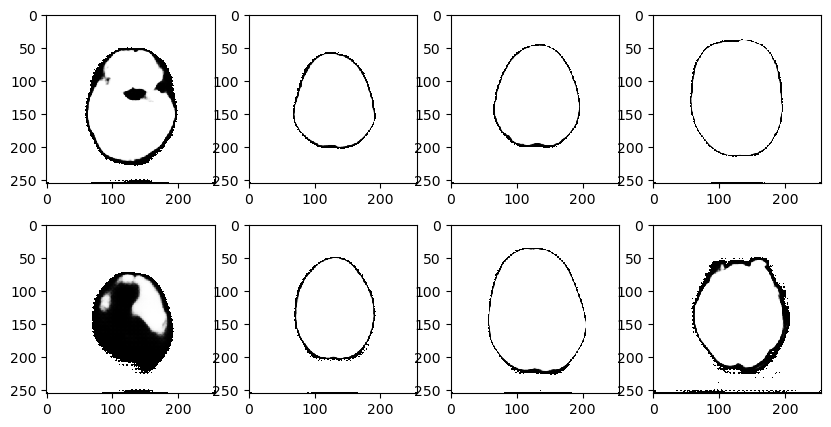

In [244]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([2,8,14,34]): axs[0,n].imshow(cfun(imgs_mask_pred_train[e],1e-7),cmap='gray'), axs[0,n]
for n,e in enumerate([46,62,69,71]): axs[1,n].imshow(cfun(imgs_mask_pred_train[e],1e-7),cmap='gray'), axs[1,n]

In [246]:
def boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

In [247]:
temp_y = boost_img(imgs_mask_pred_train[11],1e-7)

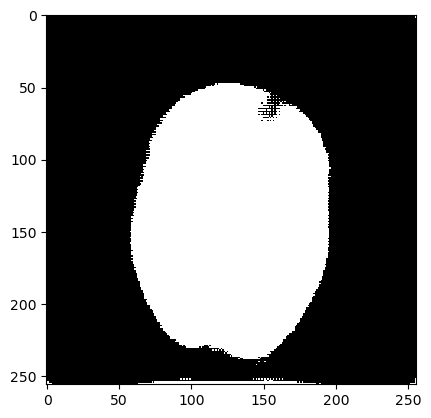

In [248]:
plt.imshow(temp_y,cmap='gray')

In [251]:
image = np.round(boost_img(imgs_mask_pred_train[11],1e-7)).astype('uint8')

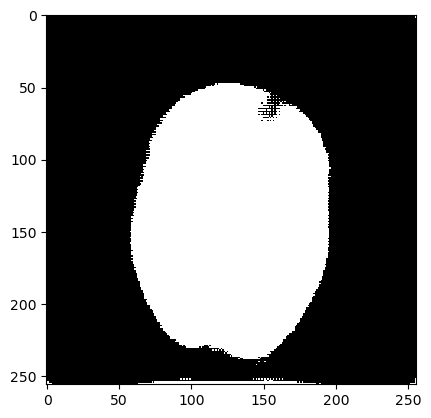

In [255]:
plt.imshow(image,cmap='gray')

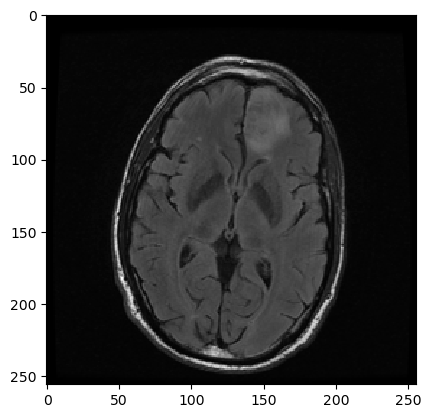

In [174]:
plt.imshow(x_train[11,:,:,1],cmap='gray')

In [261]:
x_train[11,:,:,1].max()

220.0

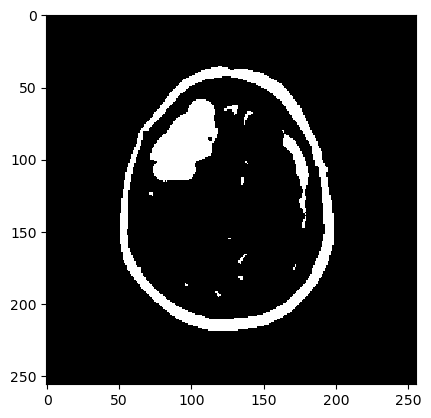

In [269]:
image = x_train[23,:,:,1].astype('uint8')
blur = cv2.blur(image, (3, 3)) # blur the image
ret, thresh = cv2.threshold(blur, 50, 255, cv2.THRESH_BINARY)
plt.imshow(thresh,cmap='gray')

#### convex hull + ellipsis hull

In [793]:
#start

In [32]:
image = np.round(boost_img(imgs_mask_pred_train[99],1e-10)).astype('uint8')
blur = cv2.blur(image, (10, 10)) # blur the image
#ret, thresh = cv2.threshold(blur, 50, 255, cv2.THRESH_BINARY)

In [33]:
image.shape

(256, 256)

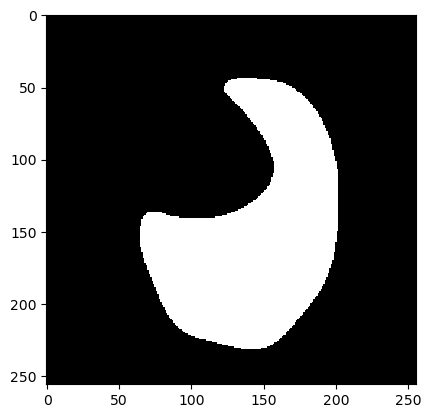

In [35]:
plt.imshow(blur,cmap='gray')

In [36]:
im2, contours, hierarchy = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [767]:
def largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

In [685]:
drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
hull = []
hull.append(cv2.convexHull(largest(contours), False))
img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)


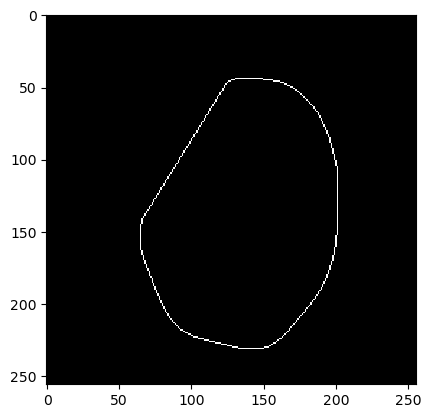

In [686]:
plt.imshow(img)

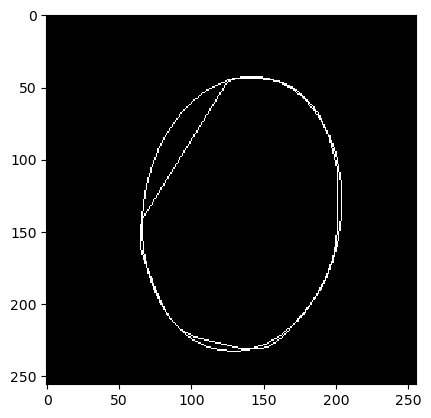

In [687]:
eli_pts = cv2.fitEllipse(hull[0])
eli = cv2.ellipse(img.copy(), eli_pts, (255,255,255), 1)
plt.imshow(eli)

In [688]:
eli.shape

(256, 256, 3)

In [689]:
gray = cv2.cvtColor(eli.copy(), cv2.COLOR_BGR2GRAY)

In [690]:
gray.shape

(256, 256)

In [702]:
gray = cv2.cvtColor(eli.copy(), cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, (1, 1)) # blur the image

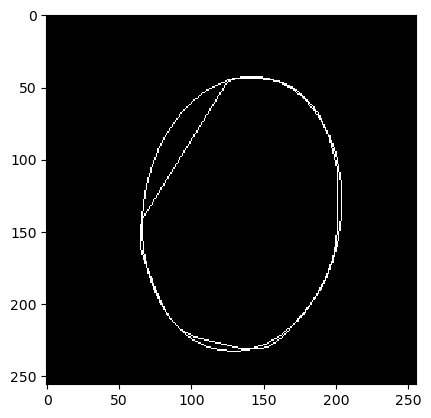

In [714]:
plt.imshow(blur,cmap='gray')

In [715]:
_, contours_2, hierarchy = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [721]:
for _ in contours_2: print(_.shape)

(225, 1, 2)
(20, 1, 2)
(4, 1, 2)
(6, 1, 2)
(40, 1, 2)
(4, 1, 2)
(6, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(6, 1, 2)
(6, 1, 2)
(10, 1, 2)
(4, 1, 2)
(6, 1, 2)
(6, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(4, 1, 2)
(130, 1, 2)
(4, 1, 2)
(4, 1, 2)
(236, 1, 2)


In [719]:
largest_index(contours_2)

29

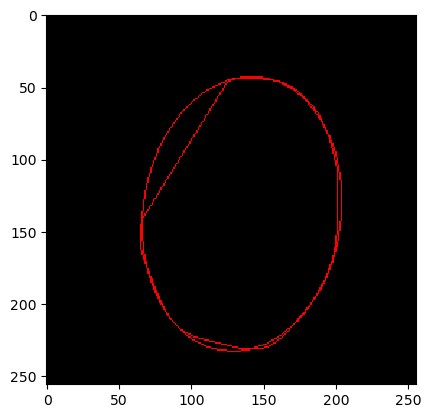

In [716]:
drawing_2 = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
for i in range(len(contours_2)):
    img_2= cv2.drawContours(drawing_2, contours_2, i, (255,0,0), 1, 8, hierarchy)
plt.imshow(img_2)

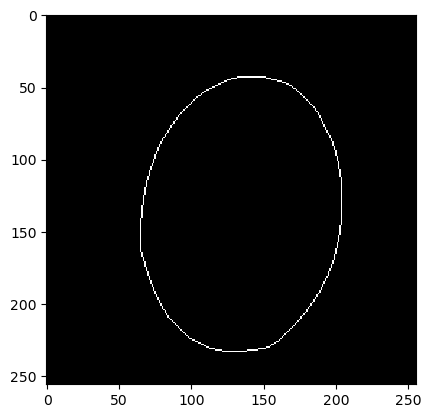

In [722]:
drawing_2 = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
hull_2 = []
hull_2.append(cv2.convexHull(contours_2[0], False))
img_2 = cv2.drawContours(drawing_2, hull_2, 0, (255,255,255), 1, 8)
plt.imshow(img_2)

In [634]:
mask_hull = cv2.fillConvexPoly(img, cv2.convexHull(largest(contours), False), (255,255,255))
mask_hull.shape

(256, 256, 3)

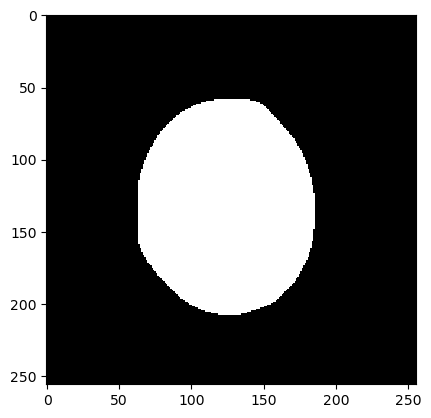

In [635]:
plt.imshow(mask_hull)

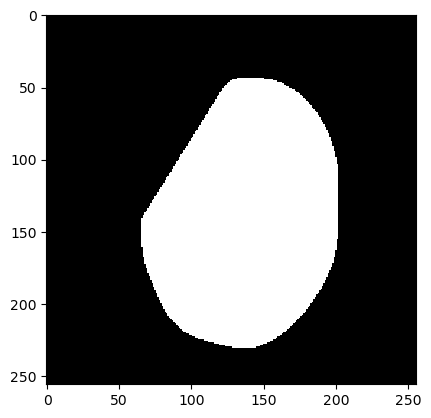

In [37]:
def largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

#find 1st hull
image = np.round(boost_img(imgs_mask_pred_train[99],1e-7)).astype('uint8')
blur = cv2.blur(image, (10, 10)) # blur the image
_, contours, _ = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
hull = []
hull.append(cv2.convexHull(largest(contours), False))
img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)

#fit ellipse
eli_pts = cv2.fitEllipse(hull[0])
eli = cv2.ellipse(img.copy(), eli_pts, (255,255,255) ,0 )

#find second hull
gray = cv2.cvtColor(eli.copy(), cv2.COLOR_BGR2GRAY)
blur_2 = cv2.blur(gray, (1, 1)) # blur the image

_, contours_2, _ = cv2.findContours(blur_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
drawing_2 = np.zeros((blur_2.shape[0], blur_2.shape[1], 3), np.uint8)
hull_2 = []
hull_2.append(cv2.convexHull(largest(contours_2), False))
img = cv2.drawContours(drawing_2, hull_2, 0, (255,255,255), 1, 8)
mask_hull = cv2.fillConvexPoly(img, hull_2[0], (255,255,255))
plt.imshow(mask_hull)

In [38]:
def largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

def transform(temp_mask, thre=1e-7):
    #find 1st hull
    image = np.round(boost_img(temp_mask,1e-7)).astype('uint8')
    blur = cv2.blur(image, (10, 10)) # blur the image
    _, contours, _ = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
    if contours == []:
        return drawing.copy()
    hull = []
    hull.append(cv2.convexHull(largest(contours), False))
    img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)

    #fit ellipse
    if len(hull[0]) < 5:
        return drawing.copy()
    eli_pts = cv2.fitEllipse(hull[0])
    eli = cv2.ellipse(img.copy(), eli_pts, (255,255,255) ,0 )

    #find second hull
    gray = cv2.cvtColor(eli.copy(), cv2.COLOR_BGR2GRAY)
    blur_2 = cv2.blur(gray, (1, 1)) # blur the image
    _, contours_2, _ = cv2.findContours(blur_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    drawing_2 = np.zeros((blur_2.shape[0], blur_2.shape[1], 3), np.uint8)
    hull_2 = []
    #hull_2.append(cv2.convexHull(largest(contours_2), False))
    hull_2.append(cv2.convexHull(contours_2[0], False))
    img = cv2.drawContours(drawing_2, hull_2, 0, (255,255,255), 1, 8)
    mask_hull = cv2.fillConvexPoly(img, hull_2[0], (255,255,255))
    
    return(mask_hull)

In [39]:
transform(imgs_mask_pred_train[11]).shape

(256, 256, 3)

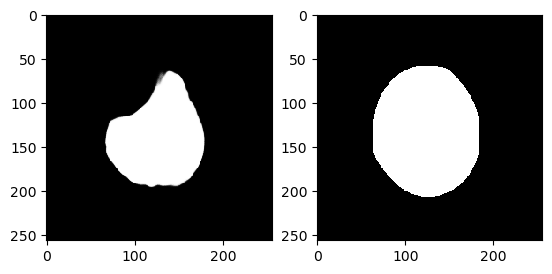

In [42]:
fig, axs = plt.subplots(1,2)
axs[0].imshow(reshape(imgs_mask_pred_train[23]),cmap='gray')
axs[1].imshow(transform(imgs_mask_pred_train[23]))

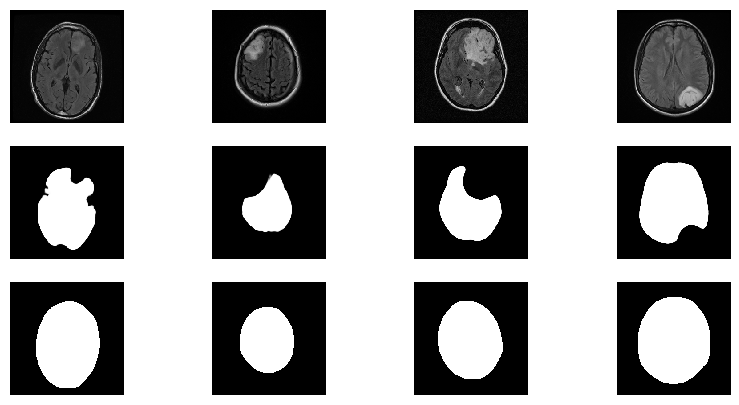

In [48]:
fig, axs = plt.subplots(3,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]):   axs[0,n].imshow((x_train[e,:,:,1]),cmap='gray'), axs[0,n].axis('off')
for n,e in enumerate([11,23,58,64]):   axs[1,n].imshow(reshape(imgs_mask_pred_train[e]),cmap='gray'), axs[1,n].axis('off')
for n,e in enumerate([11,23,58,64]): axs[2,n].imshow(transform(imgs_mask_pred_train[e]),cmap='gray'), axs[2,n].axis('off')
plt.savefig('skull_repair.png')

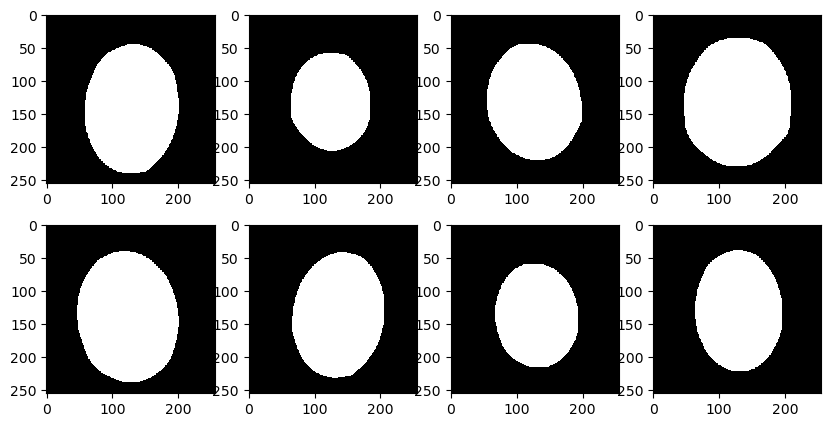

In [772]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]):   axs[0,n].imshow(reshape(imgs_mask_pred_train[e]),cmap='gray'), axs[0,n]
for n,e in enumerate([95,99,104,117]): axs[1,n].imshow(transform(imgs_mask_pred_train[e]),cmap='gray'), axs[1,n]

In [730]:
n = 11

In [733]:
x_train[11].shape

(256, 256, 3)

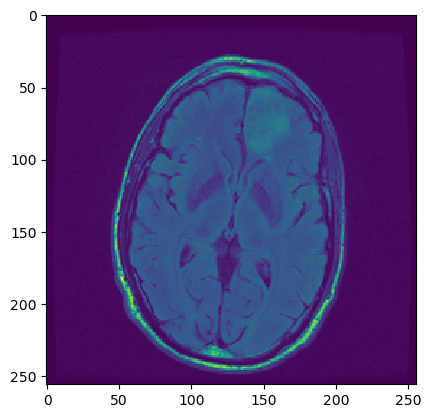

In [735]:
plt.imshow(x_train[11,:,:,1])

In [754]:
input_msk = transform(imgs_mask_pred_train[n])
input_msk.shape

(256, 256, 3)

In [755]:
unique, counts = np.unique(input_msk, return_counts=True)
print(np.asarray((unique, counts)).T)

[[     0 130218]
 [   255  66390]]


In [756]:
input_msk = (input_msk/255).astype('uint8')

In [757]:
unique, counts = np.unique(input_msk, return_counts=True)
print(np.asarray((unique, counts)).T)

[[     0 130218]
 [     1  66390]]


In [761]:
prod = (input_msk *  x_train[n])
prod.shape

(256, 256, 3)

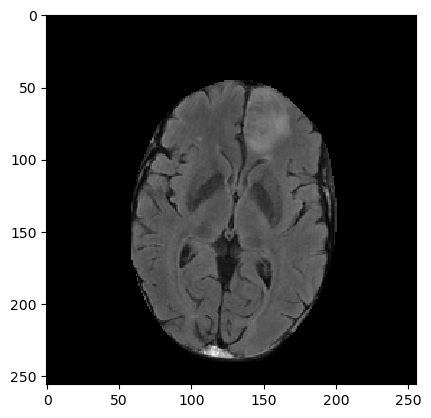

In [763]:
plt.imshow(prod[:,:,1], cmap='gray')

In [798]:
def prodify(img_set, msk_set):
    prods = []
    for n in tqdm(range(len(img_set))): 
        #print(n)
        trans_mask = transform(msk_set[n])
        input_msk = (trans_mask/255).astype('uint8')
        prods.append(input_msk * img_set[n])
    return np.array(prods)

preprocessed_x_train = prodify(x_train, imgs_mask_pred_train)
preprocessed_x_val = prodify(x_val, imgs_mask_pred_val)
preprocessed_x_test = prodify(x_test, imgs_mask_pred_test)


100%|███████████████████████████████████████████████████████████████████████████████| 393/393 [00:01<00:00, 245.60it/s]


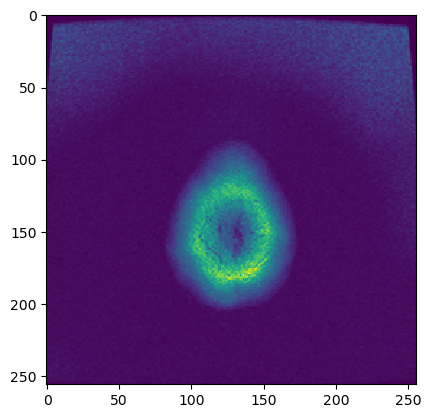

In [796]:
plt.imshow(x_train[551,:,:,1])

In [787]:
preprocessed_x_train.shape

(100, 256, 256, 3)

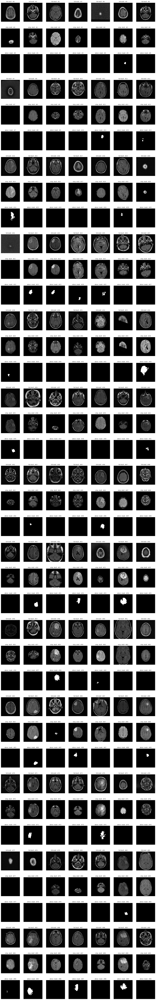

In [792]:
nrow = 7
nrep = 13
fig, axs = plt.subplots(3*nrep,nrow,figsize=(20,10*nrep))
for i in range(nrep):
    for _ in range(nrow): axs[0+3*i,_].imshow(x_train[_+nrow*i,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{_+nrow*i}', fontsize=9)
    for _ in range(nrow): axs[1+3*i,_].imshow(preprocessed_x_train[_+nrow*i,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{_+nrow*i}',fontsize=9)
    for _ in range(nrow): axs[2+3*i,_].imshow(np.reshape(y_train[_+nrow*i], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{_+nrow*i}',fontsize=9)
    
    

In [925]:
has_mask = np.zeros(len(x_train))
for _ in range(len(x_train)):
    if y_train[_].max() != 0:
        has_mask[_] = 1
unique, counts = np.unique(has_mask, return_counts=True)
print(np.asarray((unique, counts)).T)

[[0.00e+00 1.84e+03]
 [1.00e+00 9.88e+02]]


In [1225]:
has_mask_val = np.zeros(len(x_val))
for _ in range(len(x_val)):
    if y_val[_].max() != 0:
        has_mask_val[_] = 1
unique, counts = np.unique(has_mask_val, return_counts=True)
print(np.asarray((unique, counts)).T)

[[  0. 461.]
 [  1. 247.]]


In [1231]:
has_mask_test = np.zeros(len(x_test))
for _ in range(len(x_test)):
    if y_test[_].max() != 0:
        has_mask_test[_] = 1
unique, counts = np.unique(has_mask_test, return_counts=True)
print(np.asarray((unique, counts)).T)

[[  0. 255.]
 [  1. 138.]]


In [1223]:
x_train_only_pos = x_train[has_mask==1].copy()
prepro_x_train_only_pos = preprocessed_x_train[has_mask==1].copy()
y_train_only_pos = y_train[has_mask==1].copy()


In [ ]:
nrow = 7
nrep = 50
offset = 700
fig, axs = plt.subplots(3*nrep,nrow,figsize=(20,10*nrep))
for i in range(nrep):
    for _ in range(nrow): axs[0+3*i,_].imshow(x_train_only_pos[(_+nrow*i)+700,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{(_+nrow*i)+700}', fontsize=9)
    for _ in range(nrow): axs[1+3*i,_].imshow(prepro_x_train_only_pos[(_+nrow*i)+700,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{(_+nrow*i)+700}',fontsize=9)
    for _ in range(nrow): axs[2+3*i,_].imshow(np.reshape(y_train_only_pos[(_+nrow*i)+700], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{(_+nrow*i)+700}',fontsize=9)
    
    

In [1226]:
x_val_only_pos = x_val[has_mask_val==1].copy()
prepro_x_val_only_pos = preprocessed_x_val[has_mask_val==1].copy()
y_val_only_pos = y_val[has_mask_val==1].copy()


In [ ]:
nrow = 7
nrep = 35
offset = 0
fig, axs = plt.subplots(3*nrep,nrow,figsize=(20,10*nrep))
for i in range(nrep):
    for _ in range(nrow): axs[0+3*i,_].imshow(x_val_only_pos[(_+nrow*i)+offset,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{(_+nrow*i)+offset}', fontsize=9)
    for _ in range(nrow): axs[1+3*i,_].imshow(prepro_x_val_only_pos[(_+nrow*i)+offset,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{(_+nrow*i)+offset}',fontsize=9)
    for _ in range(nrow): axs[2+3*i,_].imshow(np.reshape(y_val_only_pos[(_+nrow*i)+offset], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{(_+nrow*i)+offset}',fontsize=9)
    
    

In [1232]:
x_test_only_pos = x_test[has_mask_test==1].copy()
prepro_x_test_only_pos = preprocessed_x_test[has_mask_test==1].copy()
y_test_only_pos = y_test[has_mask_test==1].copy()


In [ ]:
nrow = 7
nrep = 19
offset = 0
fig, axs = plt.subplots(3*nrep,nrow,figsize=(20,10*nrep))
for i in range(nrep):
    for _ in range(nrow): axs[0+3*i,_].imshow(x_test_only_pos[(_+nrow*i)+offset,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{(_+nrow*i)+offset}', fontsize=9)
    for _ in range(nrow): axs[1+3*i,_].imshow(prepro_x_test_only_pos[(_+nrow*i)+offset,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{(_+nrow*i)+offset}',fontsize=9)
    for _ in range(nrow): axs[2+3*i,_].imshow(np.reshape(y_test_only_pos[(_+nrow*i)+offset], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{(_+nrow*i)+offset}',fontsize=9)
    
    

#### repairing manually extreme wrong cases

In [964]:
np.where(has_mask==1)[0][136]

410

In [1328]:
n = np.where(has_mask_test==1)[0][132]
n

383

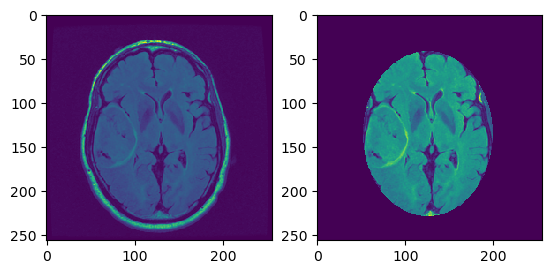

In [1339]:
fig, axs = plt.subplots(1,2)
axs[0].imshow(x_test[n,:,:,1])
axs[1].imshow(preprocessed_x_test[n,:,:,1])

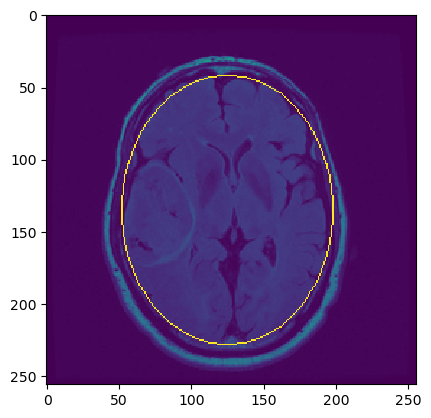

In [1334]:
#manually fitting ellipsis
img = x_test[n,:,:,1].astype('uint8').copy()
center = (125, 135) # x,y
axes = (93, 73) # first, second
angle = 90
cv2.ellipse(img, center, axes, angle, 0., 360, (255,255,255),1)
plt.imshow(img)

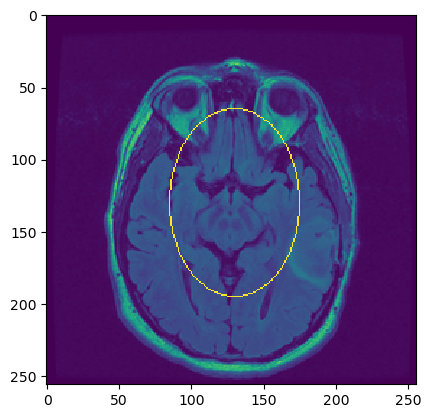

In [1287]:
#manually fitting ellipsis
img = x_test[n,:,:,1].astype('uint8').copy()
center = (130, 130) # x,y
axes = (65, 45) # first, second
angle = 90
cv2.ellipse(img, center, axes, angle, 0., 360, (255,255,255),1)
plt.imshow(img)

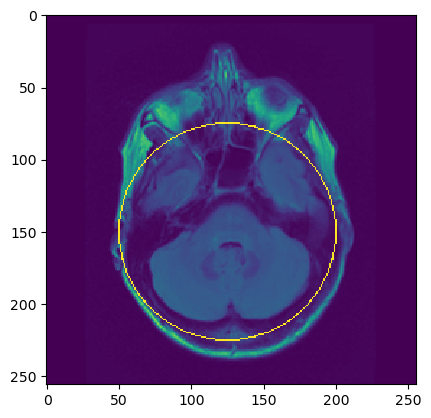

In [1322]:
#manually fitting ellipsis
img = x_test[n,:,:,1].astype('uint8').copy()
center = (125, 150) # x,y
axes = (75, 75) # first, second
angle = 90
cv2.ellipse(img, center, axes, angle, 0., 360, (255,255,255),1)
plt.imshow(img)

In [1335]:
drawing = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
drawing = cv2.ellipse(drawing, center, axes, angle, 0., 360, (255,255,255),-1)

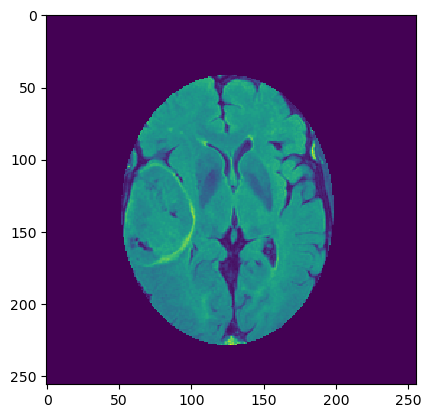

In [1336]:
#checking result
img = x_test[n].astype('uint8').copy()
drawing = drawing/255
prod = drawing * img
plt.imshow(prod[:,:,1])

In [1337]:
#overwriting original prediction
preprocessed_x_test[n] = prod

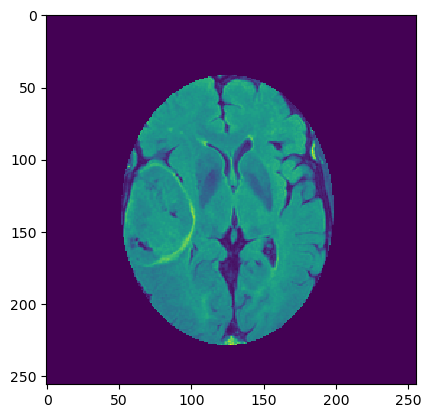

In [1338]:
plt.imshow(preprocessed_x_test[n,:,:,1])

#### saving repaired data

In [1342]:
#save
with open('data_skull_repaired_backup.npy', 'wb') as f:
    np.save(f, preprocessed_x_train)
    np.save(f, y_train)
    np.save(f, preprocessed_x_val)
    np.save(f, y_val)
    np.save(f, preprocessed_x_test)
    np.save(f, y_test)

In [1343]:
#save
with open('data_skull_preprocessed.npy', 'wb') as f:
    np.save(f, preprocessed_x_train)
    np.save(f, y_train)
    np.save(f, preprocessed_x_val)
    np.save(f, y_val)
    np.save(f, preprocessed_x_test)
    np.save(f, y_test)

In [1340]:
print(x_train.shape)
print(y_train.shape)
print(x_val.shape)
print(y_val.shape)
print(x_test.shape)
print(y_test.shape)

(2828, 256, 256, 3)
(2828, 256, 256, 1)
(708, 256, 256, 3)
(708, 256, 256, 1)
(393, 256, 256, 3)
(393, 256, 256, 1)


In [1341]:
print(preprocessed_x_train.shape)
print(y_train.shape)
print(preprocessed_x_val.shape)
print(y_val.shape)
print(preprocessed_x_test.shape)
print(y_test.shape)

(2828, 256, 256, 3)
(2828, 256, 256, 1)
(708, 256, 256, 3)
(708, 256, 256, 1)
(393, 256, 256, 3)
(393, 256, 256, 1)


#### only convex hulldef boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

In [21]:
def boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

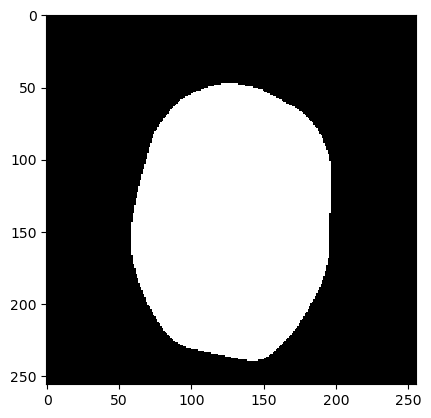

In [22]:
def get_largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

image = np.round(boost_img(imgs_mask_pred_train[11],1e-7)).astype('uint8')
blur = cv2.blur(image, (10, 10)) # blur the image
#ret, thresh = cv2.threshold(blur, 50, 255, cv2.THRESH_BINARY)

im2, contours, hierarchy = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
hull = []
hull.append(cv2.convexHull(get_largest(contours), False))
img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)  #largest_hull = get_largest(contours)

mask_hull = cv2.fillConvexPoly(img, cv2.convexHull(get_largest(contours), False), (255,255,255))
plt.imshow(mask_hull)

In [23]:
def boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

def largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

def convex_hull(img_var, threshold):
    blur = np.round(boost_img(img_var, threshold)).astype('uint8')
    #blur = cv2.blur(image, (1, 1)) # blur the image
    #ret, thresh = cv2.threshold(blur, 50, 255, cv2.THRESH_BINARY)

    im2, contours, hierarchy = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
    hull = []
    largest_contours = get_largest(contours)
    hull.append(cv2.convexHull(largest_contours, False))
    img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)  #largest_hull = get_largest(contours)

    mask_hull = cv2.fillConvexPoly(img, cv2.convexHull(largest_contours, False), (255,255,255))
    return(mask_hull)

#mask_hull = convex_hull(imgs_mask_pred_train[11], 1e-7)
#plt.imshow(mask_hull)

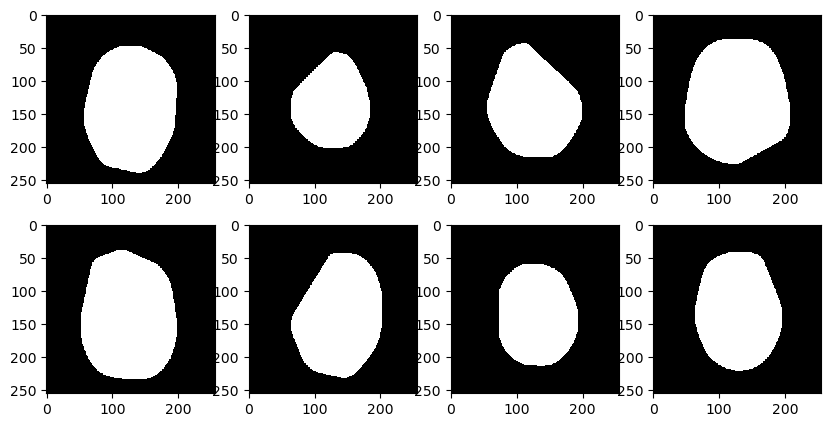

In [24]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]):   axs[0,n].imshow(convex_hull(imgs_mask_pred_train[e],1e-10),cmap='gray'), axs[0,n]
for n,e in enumerate([95,99,104,117]): axs[1,n].imshow(convex_hull(imgs_mask_pred_train[e],1e-10),cmap='gray'), axs[1,n]

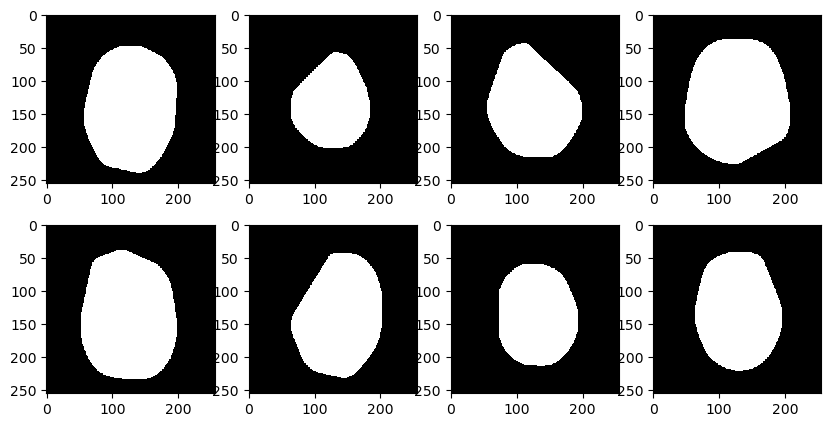

In [451]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]):   axs[0,n].imshow(convex_hull(imgs_mask_pred_train[e],1e-30),cmap='gray'), axs[0,n]
for n,e in enumerate([95,99,104,117]): axs[1,n].imshow(convex_hull(imgs_mask_pred_train[e],1e-30),cmap='gray'), axs[1,n]

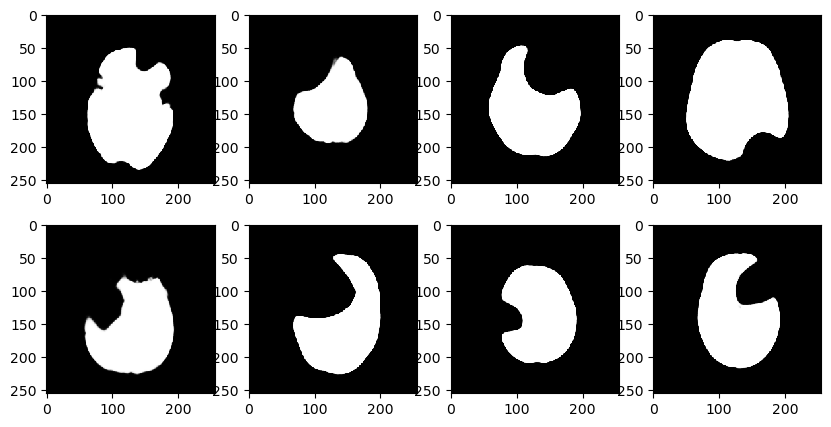

In [381]:
fig, axs = plt.subplots(2,4,figsize=(10,5))
for n,e in enumerate([11,23,58,64]): axs[0,n].imshow(reshape(imgs_mask_pred_train[e]),cmap='gray'), axs[0,n]
for n,e in enumerate([95,99,104,117]): axs[1,n].imshow(reshape(imgs_mask_pred_train[e]),cmap='gray'), axs[1,n]

In [348]:
mask_hull.shape

(256, 256, 3)

In [25]:
def boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

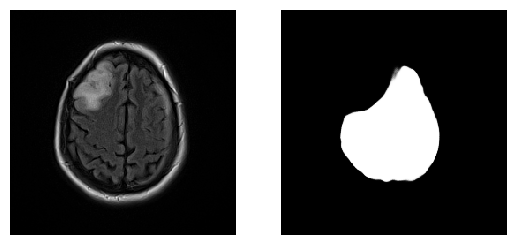

In [31]:
fig, axs = plt.subplots(1,2)
axs[0].imshow(x_train[23,:,:,1], cmap='gray'), axs[0].axis('off')
axs[1].imshow(np.reshape(imgs_mask_pred_train[23], (256,-1)),cmap='gray'),  axs[1].axis('off')
plt.savefig('skull_strip_error.png')

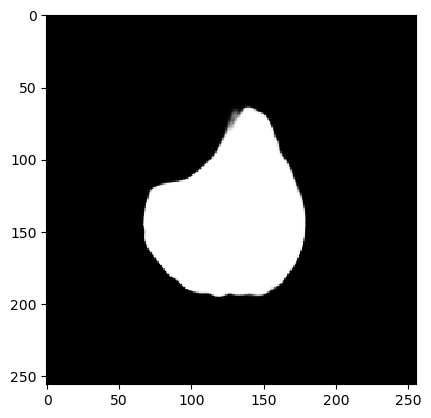

In [106]:
plt.imshow(np.reshape(imgs_mask_pred_train[23], (256,-1)),cmap='gray')


In [ ]:
#getting new mask for every instances

In [442]:
def boost_img(im, x):
    temp_y = np.reshape(im.copy(), (256,-1))
    temp_y[temp_y>=x] = 1   #setting to 1 everything above 1e-7
    return temp_y

def largest(contours):
    largest = 0
    index = 0
    for i in range(len(contours)): 
        if len(contours[i]) > largest:
            largest = len(contours[i])
            index = i
    #print(largest, index)
    return contours[index]

def convex_hull(img_var, threshold):
    image = np.round(boost_img(img_var, threshold)).astype('uint8')
    blur = cv2.blur(image, (20, 20)) # blur the image

    im2, contours, hierarchy = cv2.findContours(blur, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    drawing = np.zeros((blur.shape[0], blur.shape[1], 3), np.uint8)
    
    if contours == []:
        mask_hull = drawing.copy()
    else:
        hull = []
        largest_contours = get_largest(contours)
        hull.append(cv2.convexHull(largest_contours, False))
        img = cv2.drawContours(drawing, hull, 0, (255,255,255), 1, 8)  #largest_hull = get_largest(contours)

        mask_hull = cv2.fillConvexPoly(img, cv2.convexHull(largest_contours, False), (255,255,255))
    return(mask_hull)

#mask_hull = convex_hull(imgs_mask_pred_train[11], 1e-7)
#plt.imshow(mask_hull)

In [444]:
def get_3d_mask(temp_pred):   
    temp_mask3d = np.round(convex_hull(temp_pred, 1e-7))
    return temp_mask3d

def get_stripped_imgs(data,mask_pred):
    new_x = []
    for i in tqdm(range(len(data))):
        mask3d = get_3d_mask(mask_pred[i])
        prod3d = data[i] * mask3d
        new_x.append(prod3d)
    return np.array(new_x)

x_train_convex = get_stripped_imgs(x_train, imgs_mask_pred_train)
#x_val_convex = get_stripped_imgs(x_val, imgs_mask_pred_val)
#x_test_convex = get_stripped_imgs(x_test, imgs_mask_pred_test)

100%|█████████████████████████████████████████████████████████████████████████████| 2828/2828 [00:07<00:00, 365.99it/s]


In [ ]:
fig, axs = plt.subplots(60,10, figsize=(20,120))
for i in range(20):
    for _ in range(10): axs[0+3*i,_].imshow(x_train[_+10*i,:,:,1], cmap='gray'), axs[0+3*i,_].axis('off'), axs[0+3*i,_].set_title(f'full skull - #{_+10*i}', fontsize=9)
    for _ in range(10): axs[1+3*i,_].imshow(stripped_x_train[_+10*i,:,:,1], cmap='gray'), axs[1+3*i,_].axis('off'), axs[1+3*i,_].set_title(f'strip. skull - #{_+10*i}',fontsize=9)
    for _ in range(10): axs[2+3*i,_].imshow(np.reshape(y_train[_+10*i], (256,-1)), cmap='gray'), axs[2+3*i,_].axis('off'), axs[2+3*i,_].set_title(f'abnor. mask - #{_+10*i}',fontsize=9)

### removing empty images

In [27]:
ct = 0
ex = np.full(len(x_train), True)
for _ in range(len(x_train)):
  if x_train[_].max() < 0.5:
    ct +=1
    ex[_] = False
ex[ex==False].shape

x_train = x_train[ex].copy()
y_train = y_train[ex].copy()

In [28]:
ct = 0
ex = np.full(len(x_val), True)
for _ in range(len(x_val)):
  if x_val[_].max() < 0.5:
    ct +=1
    ex[_] = False
ex[ex==False].shape

x_val = x_val[ex].copy()
y_val = y_val[ex].copy()

In [29]:
ct = 0
ex = np.full(len(x_test), True)
for _ in range(len(x_test)):
  if x_test[_].max() < 0.5:
    ct +=1
    ex[_] = False
ex[ex==False].shape

x_test = x_test[ex].copy()
y_test = y_test[ex].copy()